In [41]:
import opinf

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# ============================================
# 2D HEAT EQUATION SIMULATION
# Parameters: u_t = α(u_xx + u_yy) + source
# ============================================

# Grid parameters
nx, ny = 64, 64  # Spatial grid points
Lx, Ly = 1.0, 1.0  # Domain size
dx = Lx / (nx - 1)
dy = Ly / (ny - 1)

# Time parameters
alpha = 0.01  # Thermal diffusivity
dt = 0.0001  # Time step (must satisfy stability: dt <= dx^2/(4*alpha))
nt = 500  # Number of time steps
save_every = 2  # Save every N steps

# Create grid
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y)

# Initial condition: two Gaussian heat sources
u = np.zeros((nx, ny))
u += 50 * np.exp(-((X - 0.3)**2 + (Y - 0.3)**2) / 0.01)
u += 30 * np.exp(-((X - 0.7)**2 + (Y - 0.7)**2) / 0.01)

# Storage for snapshots
snapshots = [u.copy()]
times = [0]

# Finite difference coefficients
r_x = alpha * dt / dx**2
r_y = alpha * dt / dy**2

# Time stepping (explicit finite difference)
print(f"Simulating 2D heat equation on {nx}x{ny} grid...")
print(f"Stability parameter: {r_x + r_y:.4f} (should be < 0.5)")

for n in range(1, nt + 1):
    u_new = u.copy()
    
    # Interior points (5-point stencil for Laplacian)
    u_new[1:-1, 1:-1] = u[1:-1, 1:-1] + \
                        r_x * (u[2:, 1:-1] - 2*u[1:-1, 1:-1] + u[:-2, 1:-1]) + \
                        r_y * (u[1:-1, 2:] - 2*u[1:-1, 1:-1] + u[1:-1, :-2])
    
    # Boundary conditions (Dirichlet: u = 0 at boundaries)
    u_new[0, :] = 0
    u_new[-1, :] = 0
    u_new[:, 0] = 0
    u_new[:, -1] = 0
    
    u = u_new
    
    # Save snapshot
    if n % save_every == 0:
        snapshots.append(u.copy())
        times.append(n * dt)

# Convert to arrays
snapshots = np.array(snapshots)
times = np.array(times)

print(f"Simulation complete!")
print(f"Data shape: {snapshots.shape} (time_steps x nx x ny)")
print(f"Time range: [{times[0]:.4f}, {times[-1]:.4f}]")
print(f"Temperature range: [{snapshots.min():.2f}, {snapshots.max():.2f}]")

Simulating 2D heat equation on 64x64 grid...
Stability parameter: 0.0079 (should be < 0.5)
Simulation complete!
Data shape: (251, 64, 64) (time_steps x nx x ny)
Time range: [0.0000, 0.0500]
Temperature range: [0.00, 49.97]


In [43]:
# Some preprocessing
fraction_training = 0.25

Q = snapshots.reshape(snapshots.shape[0], -1).T  # Each column is a snapshot

Q_training = Q[:, :int(fraction_training * Q.shape[1])]

times_training = times[:int(fraction_training * len(times))]

In [44]:
# Set up and calibrate a ROM with a rank-10 basis and quadratic model structure.
rom = opinf.ROM(
    basis=opinf.basis.PODBasis(num_vectors=10),
    ddt_estimator=opinf.ddt.UniformFiniteDifferencer(times_training),
    model=opinf.models.ContinuousModel(
        operators="AH",
        solver=opinf.lstsq.L2Solver(regularizer=1e-4),
    )
).fit(states=Q_training)

/home/anthonypoole/miniconda3/envs/IEEE/lib/python3.13/site-packages/opinf/lstsq/_tikhonov.py:79: OpInfWarning: non-regularized least-squares system is underdetermined
  warnings.warn(


In [45]:
# Solve the ROM over a specified time domain.
Q_rom = rom.predict(Q[:, 0], times)

# Compute the error of the ROM prediction.
absolute_error, relative_error = opinf.post.Lp_error(Q, Q_rom, times)

In [46]:
absolute_error, relative_error

(np.float64(1.4934876513525446), np.float64(0.015190492517947931))

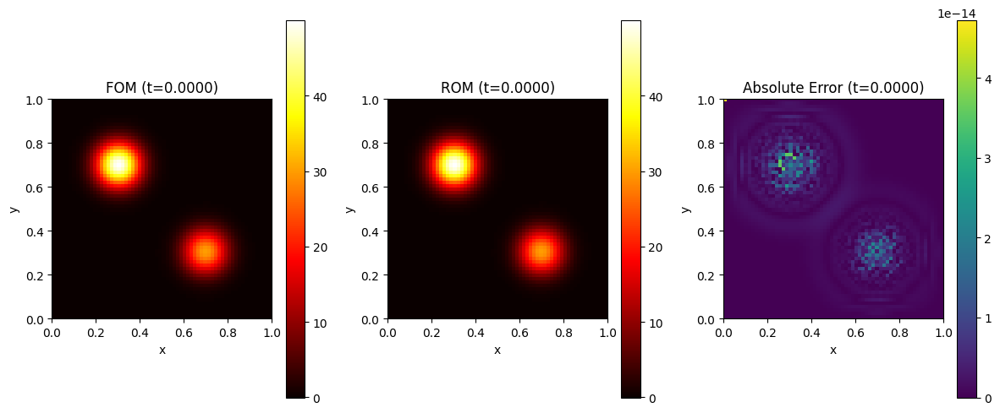

In [47]:
import matplotlib.pyplot as plt
import matplotlib.animation as ani
from IPython.display import HTML

fig, ax = plt.subplots(1, 3, figsize=(12, 5))

min_val = min(Q.min(), Q_rom.min())
max_val = max(Q.max(), Q_rom.max())

# Plot on the correct axes
img0 = ax[0].imshow(Q[:,0].reshape(nx, ny), vmin=min_val, vmax=max_val, cmap='hot', extent=[0, Lx, 0, Ly])
ax[0].set_title('Full Order Model (FOM)')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
fig.colorbar(img0, ax=ax[0])

img1 = ax[1].imshow(Q_rom[:,0].reshape(nx, ny), vmin=min_val, vmax=max_val, cmap='hot', extent=[0, Lx, 0, Ly])
ax[1].set_title('Reduced Order Model (ROM)')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
fig.colorbar(img1, ax=ax[1])

img2 = ax[2].imshow(np.abs(Q[:,0] - Q_rom[:,0]).reshape(nx, ny), extent=[0, Lx, 0, Ly])
ax[2].set_title('Absolute Error')
ax[2].set_xlabel('x')
ax[2].set_ylabel('y')
fig.colorbar(img2, ax=ax[2])

img = [img0, img1, img2]

def update(frame):
    img[0].set_array(Q[:,frame].reshape(nx, ny))
    img[1].set_array(Q_rom[:,frame].reshape(nx, ny))
    img[2].set_array(np.abs(Q[:,frame] - Q_rom[:,frame]).reshape(nx, ny))
    ax[0].set_title(f'FOM (t={times[frame]:.4f})')
    ax[1].set_title(f'ROM (t={times[frame]:.4f})')
    ax[2].set_title(f'Absolute Error (t={times[frame]:.4f})')
    return img

anim = ani.FuncAnimation(fig, update, frames=Q.shape[1], interval=100)
plt.tight_layout()

HTML(anim.to_jshtml())

### Now do the horizontal concatatenation (multiple intial conditions)